# Web Scraping Data from IMDB and data wrangling

In [25]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PolynomialFeatures
from sklearn.model_selection import StratifiedKFold
from sklearn.decomposition import PCA, KernelPCA
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, mean_absolute_error, r2_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import math
import plotly.express as px
import plotly.graph_objects as go

In [91]:
# Creating an empty list to add our data
main_list = []

# Start
start = 1

# Count
count = 250         # Max value is 250

In [92]:
URL = "https://www.imdb.com"
movies = f"/search/title/?title_type=feature&start={start}&count={count}"
URL_UPCOMING = "https://www.imdb.com/calendar/?ref_=rlm&region=CA&type=MOVIE"

In [93]:
# How many data you need
total_data = 100000

# Total loops
loop = total_data//count           # we see 50 data on 1 page at a time

print(loop)

400


In [94]:
total_data

100000

In [ ]:
for i in range(loop):
    URL_MOVIES = URL + movies
    source = requests.get(URL_MOVIES).text
    # r = requests.get(source, headers={'User-Agent': 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:15.0) Gecko/20100101 Firefox/15.0.1'})
    soup = BeautifulSoup(source, 'lxml')
    movies = soup.find(class_ = 'desc').findAll('a')[-1]['href']
    article = soup.findAll('div', class_='lister-item-content')
    main_list += article
    print(i)

## Raw data collected

In [ ]:
# Making list for the information to be extracted
popularity_ranking = []
name = []
rating = []
summary = []
votes = []
cast = []
certificate = []
runtime = []
genre = []
year = []
director = []
gross = []
pre_production = []
metascore = []

In [ ]:
for i in range(len(main_list)):
    print(i)
    temp = ''
    try:
        popularity_ranking.append(main_list[i].h3.span.text)
        name.append(main_list[i].h3.a.text)
        certificate.append(main_list[i].findAll('p')[0].find('span', class_= 'certificate').text)
        genre.append(main_list[i].findAll('p')[0].find('span', class_='genre').text)
        rating.append(main_list[i].div.div.strong.text)
        year.append(main_list[i].h3.find('span', class_= 'lister-item-year text-muted unbold').text)
        runtime.append(main_list[i].findAll('p')[0].find('span', class_='runtime').text)
        summary.append(main_list[i].findAll('p')[1].text)
        votes.append(main_list[i].findAll('p')[3].findAll('span')[1].text)
        gross.append(main_list[i].findAll('p')[3].findAll('span')[4].text)
        pre_production.append(main_list[i].findAll('p')[0].b.text)
        metascore.append(main_list[i].div.find(class_= 'metascore').text)

        director.append(main_list[i].findAll('p')[2].findAll('a')[0].text)
        for casting in main_list[i].findAll('p')[2].findAll('a')[1:]:
            temp += casting.text + ", "
        cast.append(temp[:2])

    except:
        pass

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [ ]:
print("Popularity ranking: ", len(popularity_ranking))
print("Name: ", len(name))
print("Genre: ", len(genre))
print("Certificate: ", len(certificate))
print("Rating: ", len(rating))
print("Summary: ", len(summary))
print("Runtime: ", len(runtime))
print("Year: ", len(year))
print("Gross: ", len(gross))
print("Votes: ", len(votes))
print("Cast: ", len(cast))
print("Director: ", len(director))
print("Pre Production: ", len(pre_production))
print("Metascore: ", len(metascore))

Popularity ranking:  100000
Name:  100000
Genre:  26334
Certificate:  26342
Rating:  26194
Summary:  26150
Runtime:  26150
Year:  26194
Gross:  11240
Votes:  26149
Cast:  0
Director:  0
Pre Production:  0
Metascore:  0


In [ ]:
# Making list for the information to be extracted
popularity_ranking = []
name = []
rating = []
summary = []
votes = []
cast = []
certificate = []
runtime = []
genre = []
year = []
director = []
gross = []
pre_production = []
metascore = []

## All of the tags below has no missing values so we can extract the data easily 

In [ ]:
for i in range(len(main_list)):
    print(i)
    popularity_ranking.append(main_list[i].h3.span.text)
    name.append(main_list[i].h3.a.text)
    year.append(main_list[i].h3.find('span', class_= 'lister-item-year text-muted unbold').text)
    summary.append(main_list[i].findAll('p')[1].text)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

### Tags below has missing values which will throw error; so we are filling those values with '' so we have exact same data size

In [ ]:
# Cast 
for i in range(len(main_list)):
    temp = ''
    for casting in main_list[i].findAll('p')[2].findAll('a')[1:]:
        temp += casting.text + ", "
    
    if temp[:-2] == []:
        cast.append(np.NaN)
    else:
        cast.append(temp[:-2])

In [ ]:
# Director
for i in range(len(main_list)):
    try:
        director.append(main_list[i].findAll('p')[2].findAll('a')[0].text)
    except IndexError:
        director.append(np.NaN)

In [ ]:
# Pre Preoduction
for i in range(len(main_list)):
    try:
        pre_production.append(main_list[i].findAll('p')[0].b.text)
    except AttributeError:
        pre_production.append(False)

In [ ]:
# MetaScore
for i in range(len(main_list)):
    try:
        metascore.append(main_list[i].div.find(class_= 'metascore').text)
    except AttributeError:
        metascore.append(np.NaN)

In [ ]:
# Certificate
for i in range(len(main_list)):
    try:
        certificate.append(main_list[i].findAll('p')[0].find('span', class_= 'certificate').text)
    except AttributeError:
        certificate.append(np.NaN)

In [ ]:
# Rating
for i in range(len(main_list)):
    try:
        rating.append(main_list[i].div.div.strong.text)
    except AttributeError:
        rating.append(np.NaN)

In [ ]:
# Runtime
for i in range(len(main_list)):
    try:
        runtime.append(main_list[i].findAll('p')[0].find('span', class_='runtime').text)
    except AttributeError:
        runtime.append(np.NaN)

In [ ]:
# Votes
for i in range(len(main_list)):
    try:
        votes.append(main_list[i].findAll('p')[3].findAll('span')[1].text)
    except IndexError:
        votes.append(np.NaN)

In [ ]:
# Genre
for i in range(len(main_list)):
    try:
        genre.append(main_list[i].findAll('p')[0].find('span', class_='genre').text)
    except AttributeError:
        genre.append(np.NaN)

In [ ]:
# Gross
for i in range(len(main_list)):
    try:
        gross.append(main_list[i].findAll('p')[3].findAll('span')[4].text)
    except IndexError:
        gross.append(np.NaN)

### Values

In [ ]:
print("Popularity ranking: ", len(popularity_ranking))
print("Name: ", len(name))
print("Genre: ", len(genre))
print("Certificate: ", len(certificate))
print("Rating: ", len(rating))
print("Summary: ", len(summary))
print("Runtime: ", len(runtime))
print("Year: ", len(year))
print("Votes: ", len(votes))
print("Gross: ", len(gross))
print("Cast: ", len(cast))
print("Director: ", len(director))
print("Pre Production: ", len(pre_production))
print("Metascore: ", len(metascore))

Popularity ranking:  100000
Name:  100000
Genre:  100000
Certificate:  100000
Rating:  100000
Summary:  100000
Runtime:  100000
Year:  100000
Votes:  100000
Gross:  100000
Cast:  100000
Director:  100000
Pre Production:  100000
Metascore:  100000


## Creating Database

In [ ]:
dictonary = {"Popularity Ranking" : popularity_ranking,
             "Name" : name,
             "Year" : year,
             "Certificate" : certificate,
             "Runtime" : runtime,
             "Genre" : genre,
             "Rating" : rating,
             "Summary" : summary, 
             "Director" : director,
             "Stars" : cast,
             "Votes" : votes,
             "Gross" : gross,
             "Pre Production" : pre_production,
             "Meta Score" : metascore}
db = pd.DataFrame(dictonary, columns= dictonary.keys())

In [ ]:
# Initial saving

db.to_csv('main.csv')

In [ ]:
# Reading data

db = pd.read_csv('main.csv')
db.drop(columns= 'Unnamed: 0', inplace= True)

In [ ]:
db['Pre Production'].unique()

array(['False', 'Completed', 'Post-production', 'Announced', 'Filming',
       'Pre-production', 'Abandoned', 'Delayed'], dtype=object)

In [ ]:
db.iloc[-2]
# 

Popularity Ranking                                              99,999.
Name                                    Saikô no jinsei no mitsuke kata
Year                                                             (2019)
Certificate                                                         NaN
Runtime                                                         115 min
Genre                                    \nAdventure, Drama            
Rating                                                              5.9
Summary               \nA lady called Mako has done well for herself...
Director                                                   Isshin Inudô
Stars                 Sayuri Yoshinaga, Yûki Amami, Tsuyoshi Muro, H...
Votes                                                                85
Gross                                                               NaN
Pre Production                                                    False
Meta Score                                                      

In [ ]:
db.isna().sum()

Popularity Ranking        0
Name                      0
Year                   5022
Certificate           73658
Runtime               10454
Genre                   854
Rating                 9827
Summary                   0
Director                598
Stars                  1906
Votes                  9824
Gross                 85322
Pre Production            0
Meta Score            84575
dtype: int64

### Since we got a lot of missing values while we were scrapping the data, we will enrich the data by getting the missing NaN values from BoxOfficeMOJO which is powered by IMdbPro

### After doing some research on the website, we have checked that there are no 'Meta Score', 'Votes', and 'Rating' available their. So, we will handle these values by dropping the Meta Score column and removing rows for Votes and Rating with null valuse

In [ ]:
main_db = db.copy()

In [ ]:
main_db.drop(columns= 'Meta Score', inplace= True)
main_db.dropna(subset= ['Votes', 'Rating'], inplace= True)

In [ ]:
main_db = main_db[main_db.isna().any(axis= 1)]

In [ ]:
main_db.shape

(78932, 13)

In [ ]:
main_db.isna().sum()

Popularity Ranking        0
Name                      0
Year                     12
Certificate           63974
Runtime                2625
Genre                   263
Rating                    0
Summary                   0
Director                 64
Stars                   205
Votes                     0
Gross                 75494
Pre Production            0
dtype: int64

We will also be removing 'Year' rows since total number of those data is too less

In [ ]:
main_db.dropna(subset= 'Year', inplace= True)
main_db.shape

(78920, 13)

### We will be trying to recover above missing values from the above mentioned website

In [ ]:
certificate = []
runtime = []
genre = []
gross = []
director = []
size = main_db.shape[0]

In [ ]:
main_db.reset_index(drop= True, inplace= True)

In [ ]:
main_db.shape

(78920, 13)

In [ ]:
main_db.head()

,Popularity Ranking,Name,Year,Certificate,Runtime,Genre,Rating,Summary,Director,Stars,Votes,Gross,Pre Production
0,1.,John Wick: Chapter 4,(2023),14A,169 min,"\nAction, Crime, Thriller",8.4,\nJohn Wick uncovers a path to defeating The H...,Chad Stahelski,"Keanu Reeves, Laurence Fishburne, George Georg...","64,193",NaN,False
1,3.,Shazam! Fury of the Gods,(2023),PG,130 min,"\nAction, Adventure, Comedy",6.6,\nThe film continues the story of teenage Bill...,David F. Sandberg,"Zachary Levi, Asher Angel, Jack Dylan Grazer, ...","24,560",NaN,False
2,4.,Scream VI,(2023),14A,122 min,"\nHorror, Mystery, Thriller",7.2,"\nIn the next installment, the survivors of th...",Matt Bettinelli-Olpin,"Tyler Gillett, Courteney Cox, Melissa Barrera,...","35,538",NaN,False
3,5.,The Whale,(2022),14A,117 min,\nDrama,7.8,"\nA reclusive, morbidly obese English teacher ...",Darren Aronofsky,"Brendan Fraser, Sadie Sink, Ty Simpkins, Hong ...","113,737",NaN,False
4,6.,Boston Strangler,(2023),R,112 min,"\nCrime, Drama, History",6.5,\nLoretta McLaughlin was the reporter who firs...,Matt Ruskin,"Keira Knightley, Carrie Coon, Chris Cooper, Al...","12,285",NaN,False


In [ ]:
main_db.iloc[44]

Popularity Ranking                                                  77.
Name                                                Chor Nikal Ke Bhaga
Year                                                             (2023)
Certificate                                                       TV-MA
Runtime                                                         110 min
Genre                              \nCrime, Drama, Thriller            
Rating                                                              8.0
Summary               \nA flight attendant and her business partner ...
Director                                                     Ajay Singh
Stars                 Yami Gautam, Sunny Kaushal, Sharad Kelkar, Ind...
Votes                                                            21,679
Gross                                                               NaN
Pre Production                                                    False
Name: 44, dtype: object

In [ ]:
searched_key = []

MOJO = 'http://boxofficemojo.com'

for i in range(size//2):
    print(i)
    name = main_db['Name'][i]    
    temp_name = re.sub(' ', '+', name)
    key = '/search/?q='+ temp_name                                                                 # This will be updated for each column

    # We are searching boxofficemojo with the name of the movie
    SEARCH_URL = MOJO + key
    source = requests.get(SEARCH_URL).text
    # r = requests.get(source, headers={'User-Agent': 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:15.0) Gecko/20100101 Firefox/15.0.1'})
    soup = BeautifulSoup(source, 'lxml')

    article = soup
    try:
        if name == soup.find(class_ = 'a-size-medium a-link-normal a-text-bold').text:
            searched_key.append(soup.find(class_ = 'a-size-medium a-link-normal a-text-bold')['href'])
        else:
            searched_key.append('')
    except AttributeError:
        searched_key.append('')


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [ ]:
for i in range(size//2, size):
    print(i)
    name = main_db['Name'][i]    
    temp_name = re.sub(' ', '+', name)
    key = '/search/?q='+ temp_name                                                                 # This will be updated for each column

    # We are searching boxofficemojo with the name of the movie
    SEARCH_URL = MOJO + key
    source = requests.get(SEARCH_URL).text
    # r = requests.get(source, headers={'User-Agent': 'Mozilla/5.0 (X11; Ubuntu; Linux x86_64; rv:15.0) Gecko/20100101 Firefox/15.0.1'})
    soup = BeautifulSoup(source, 'lxml')

    article = soup
    try:
        if name == soup.find(class_ = 'a-size-medium a-link-normal a-text-bold').text:
            searched_key.append(soup.find(class_ = 'a-size-medium a-link-normal a-text-bold')['href'])
        else:
            searched_key.append('')
    except AttributeError:
        searched_key.append('')

39460
39461
39462
39463
39464
39465
39466
39467
39468
39469
39470
39471
39472
39473
39474
39475
39476
39477
39478
39479
39480
39481
39482
39483
39484
39485
39486
39487
39488
39489
39490
39491
39492
39493
39494
39495
39496
39497
39498
39499
39500
39501
39502
39503
39504
39505
39506
39507
39508
39509
39510
39511
39512
39513
39514
39515
39516
39517
39518
39519
39520
39521
39522
39523
39524
39525
39526
39527
39528
39529
39530
39531
39532
39533
39534
39535
39536
39537
39538
39539
39540
39541
39542
39543
39544
39545
39546
39547
39548
39549
39550
39551
39552
39553
39554
39555
39556
39557
39558
39559
39560
39561
39562
39563
39564
39565
39566
39567
39568
39569
39570
39571
39572
39573
39574
39575
39576
39577
39578
39579
39580
39581
39582
39583
39584
39585
39586
39587
39588
39589
39590
39591
39592
39593
39594
39595
39596
39597
39598
39599
39600
39601
39602
39603
39604
39605
39606
39607
39608
39609
39610
39611
39612
39613
39614
39615
39616
39617
39618
39619
39620
39621
39622
39623
39624
39625
3962

In [ ]:
len(searched_key)

78920

In [ ]:
# Saving data so we can use it again, since scraping data took ~4000m 

dictonary = {"Link" : searched_key}
key_db = pd.DataFrame(dictonary, columns= dictonary.keys())
key_db.to_csv('Searched_key.csv')

In [ ]:
key_db = pd.read_csv('Searched_key.csv')
key_db.drop(columns= 'Unnamed: 0', inplace= True)

In [ ]:
key_db.head()

,Link
0,/title/tt10366206/?ref_=bo_se_r_1
1,/title/tt10151854/?ref_=bo_se_r_1
2,/title/tt17663992/?ref_=bo_se_r_1
3,/title/tt13833688/?ref_=bo_se_r_1
4,NaN


In [ ]:
# Testing

certificate_ = np.NaN
runtime_ = np.NaN
genre_ = np.NaN
gross_ = np.NaN

MOJO = 'http://boxofficemojo.com'
main_list = []
MAIN_URL = MOJO + key_db.iloc[0]['Link']
source = requests.get(MAIN_URL).text
soup = BeautifulSoup(source, 'lxml')
main_list.append(soup)
print(main_list)

In [ ]:
# Testing

key_db.isna().sum()

# Since we still have a large number of missing values after scraping data from other website, we will be making a new df and dropping these missing values from 'main_db'
# and use the remaining values to appened in our database.

Link    63417
dtype: int64

In [ ]:
print(main_db.shape)
print(key_db.shape)

(78920, 13)
(78920, 1)


In [ ]:
main_db.head()

,Popularity Ranking,Name,Year,Certificate,Runtime,Genre,Rating,Summary,Director,Stars,Votes,Gross,Pre Production
0,1.,John Wick: Chapter 4,(2023),14A,169 min,"\nAction, Crime, Thriller",8.4,\nJohn Wick uncovers a path to defeating The H...,Chad Stahelski,"Keanu Reeves, Laurence Fishburne, George Georg...","64,193",NaN,False
1,3.,Shazam! Fury of the Gods,(2023),PG,130 min,"\nAction, Adventure, Comedy",6.6,\nThe film continues the story of teenage Bill...,David F. Sandberg,"Zachary Levi, Asher Angel, Jack Dylan Grazer, ...","24,560",NaN,False
2,4.,Scream VI,(2023),14A,122 min,"\nHorror, Mystery, Thriller",7.2,"\nIn the next installment, the survivors of th...",Matt Bettinelli-Olpin,"Tyler Gillett, Courteney Cox, Melissa Barrera,...","35,538",NaN,False
3,5.,The Whale,(2022),14A,117 min,\nDrama,7.8,"\nA reclusive, morbidly obese English teacher ...",Darren Aronofsky,"Brendan Fraser, Sadie Sink, Ty Simpkins, Hong ...","113,737",NaN,False
4,6.,Boston Strangler,(2023),R,112 min,"\nCrime, Drama, History",6.5,\nLoretta McLaughlin was the reporter who firs...,Matt Ruskin,"Keira Knightley, Carrie Coon, Chris Cooper, Al...","12,285",NaN,False


In [ ]:
# main_db_2 = main_db.append(key_db, ignore_index= True)
main_db_2 = pd.concat([main_db, key_db], axis= 1)

In [ ]:
(main_db_2.head())


,Popularity Ranking,Name,Year,Certificate,Runtime,Genre,Rating,Summary,Director,Stars,Votes,Gross,Pre Production,Link
0,1.,John Wick: Chapter 4,(2023),14A,169 min,"\nAction, Crime, Thriller",8.4,\nJohn Wick uncovers a path to defeating The H...,Chad Stahelski,"Keanu Reeves, Laurence Fishburne, George Georg...","64,193",NaN,False,/title/tt10366206/?ref_=bo_se_r_1
1,3.,Shazam! Fury of the Gods,(2023),PG,130 min,"\nAction, Adventure, Comedy",6.6,\nThe film continues the story of teenage Bill...,David F. Sandberg,"Zachary Levi, Asher Angel, Jack Dylan Grazer, ...","24,560",NaN,False,/title/tt10151854/?ref_=bo_se_r_1
2,4.,Scream VI,(2023),14A,122 min,"\nHorror, Mystery, Thriller",7.2,"\nIn the next installment, the survivors of th...",Matt Bettinelli-Olpin,"Tyler Gillett, Courteney Cox, Melissa Barrera,...","35,538",NaN,False,/title/tt17663992/?ref_=bo_se_r_1
3,5.,The Whale,(2022),14A,117 min,\nDrama,7.8,"\nA reclusive, morbidly obese English teacher ...",Darren Aronofsky,"Brendan Fraser, Sadie Sink, Ty Simpkins, Hong ...","113,737",NaN,False,/title/tt13833688/?ref_=bo_se_r_1
4,6.,Boston Strangler,(2023),R,112 min,"\nCrime, Drama, History",6.5,\nLoretta McLaughlin was the reporter who firs...,Matt Ruskin,"Keira Knightley, Carrie Coon, Chris Cooper, Al...","12,285",NaN,False,NaN


In [ ]:
main_db_2.shape

(78920, 14)

In [ ]:
# Now lets drop all the rows which have NaN on Link column, so we are left with just the data which we can scrape from the website with the Link

main_db_2.dropna(subset= 'Link', inplace= True)
main_db_2.shape

(15503, 14)

In [ ]:
# This is all the value wi will scrape and add in our existing 'db' database

main_db_2.isna().sum()

Popularity Ranking        0
Name                      0
Year                      0
Certificate           10714
Runtime                 261
Genre                    39
Rating                    0
Summary                   0
Director                 16
Stars                    35
Votes                     0
Gross                 13890
Pre Production            0
Link                      0
dtype: int64

In [ ]:
# Reseting index again, so we can loop properly

main_db_2.reset_index(drop= True, inplace= True)

In [ ]:
# Calling each title to get the missing information for each movie (1)

main_list = []
MOJO = 'http://boxofficemojo.com'
for i in range(main_db_2.shape[0]):
    print(i)
    key = main_db_2.iloc[i]['Link']

    # We are searching boxofficemojo with the searched key to get to the page we need
    MAIN_URL = MOJO + key

    source = requests.get(MAIN_URL).text
    soup = BeautifulSoup(source, 'lxml')
    main_list.append(soup)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

ConnectionError: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))

In [ ]:
temp_size = len(main_list)
temp_size

2017

In [ ]:
for i in range(temp_size+1, main_db_2.shape[0]):
    print(i)
    key = main_db_2.iloc[i]['Link']

    # We are searching boxofficemojo with the searched key to get to the page we need
    MAIN_URL = MOJO + key

    source = requests.get(MAIN_URL).text
    soup = BeautifulSoup(source, 'lxml')
    main_list.append(soup)

2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
2162
2163
2164
2165
2166
2167
2168
2169
2170
2171
2172
2173
2174
2175
2176
2177
2178
2179
2180
2181
2182
2183
2184
2185
2186
2187
2188
2189
2190
2191
2192
2193
2194
2195
2196
2197
2198
2199
2200
2201
2202
2203
2204
2205
2206
2207
2208
2209
2210
2211
2212
2213
2214
2215
2216
2217


ConnectionError: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))

In [ ]:
temp_size = len(main_list)
temp_size

15502

In [ ]:
for i in range(temp_size+1, main_db_2.shape[0]):
    print(i)
    key = main_db_2.iloc[i]['Link']

    # We are searching boxofficemojo with the searched key to get to the page we need
    MAIN_URL = MOJO + key

    source = requests.get(MAIN_URL).text
    soup = BeautifulSoup(source, 'lxml')
    main_list.append(soup)

8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475
8476
8477
8478
8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616
8617
8618
8619
8620
8621
8622
8623
8624
8625
8626
8627
8628
8629
8630
8631
8632
8633
8634
8635
8636
8637
8638
8639
8640
8641
8642
8643
8644
8645
8646
8647
8648
8649
8650
8651
8652
8653
8654
8655
8656
8657
8658
8659
8660
8661


In [ ]:
# Testing

temp_store = main_list[0]

temp_store.find(class_ = "a-section a-spacing-none mojo-summary-values mojo-hidden-from-mobile").findAll('span')

[<span>Domestic Distributor</span>,
 <span>Lionsgate<br/><a class="a-size-small a-link-normal" href="https://pro.imdb.com/company/co0173285/boxoffice/?ref_=mojo_tt_su&amp;rf=mojo_tt_su" rel="noopener" target="_blank">See full company information<svg class="mojo-new-window-svg" viewbox="0 0 32 32" xmlns="http://www.w3.org/2000/svg">
 <path d="M24,15.57251l3,3V23.5A3.50424,3.50424,0,0,1,23.5,27H8.5A3.50424,3.50424,0,0,1,5,23.5V8.5A3.50424,3.50424,0,0,1,8.5,5h4.92755l3,3H8.5a.50641.50641,0,0,0-.5.5v15a.50641.50641,0,0,0,.5.5h15a.50641.50641,0,0,0,.5-.5ZM19.81952,8.56372,12.8844,17.75a.49989.49989,0,0,0,.04547.65479l.66534.66528a.49983.49983,0,0,0,.65479.04553l9.18628-6.93518,2.12579,2.12585a.5.5,0,0,0,.84741-.27526l1.48273-9.35108a.50006.50006,0,0,0-.57214-.57214L17.969,5.59058a.5.5,0,0,0-.27526.84741Z"></path>
 </svg></a></span>,
 <span>Domestic Opening</span>,
 <span><a class="a-link-normal" href="/release/rl1644725761/weekend?ref_=bo_tt_gr#table"><span class="money">$73,817,950</span><

In [ ]:
main_db_2.iloc[14323]

Popularity Ranking                                              88,550.
Name                                               Du bist nicht allein
Year                                                             (2007)
Certificate                                                         NaN
Runtime                                                          94 min
Genre                              \nComedy, Drama, Romance            
Rating                                                              6.3
Summary               \nThe upholsterer Hans Moll and his wife, the ...
Director                                                  Bernd Böhlich
Stars                 Katharina Thalbach, Axel Prahl, Ekaterina Medv...
Votes                                                               295
Gross                                                               NaN
Pre Production                                                    False
Link                                   /title/tt1034388/?ref_=bo

In [ ]:
certificate_ = []
runtime_ = []
genre_ = []
gross_ = []

for index in range(len(main_list)):
    print(index)

    try:

        gross = main_list[index].find(class_ = 'a-section a-spacing-none mojo-performance-summary-table').findAll(class_ = 'money')[-1].text
        temp_store = main_list[index].find(class_ = 'a-section a-spacing-none mojo-summary-values mojo-hidden-from-mobile').findAll('span')                                # Loop and compare; to get rest of the values 

        for i,j in zip(temp_store, range(len(temp_store))):
            if i.text == 'Running Time':
                runtime = (temp_store[j+1].text)
            elif i.text == 'MPAA':
                certificate = (temp_store[j+1].text)
            elif i.text == 'Genres':
                genre = (temp_store[j+1].text)
        
        gross_ .append(gross)
        runtime_.append(runtime)
        certificate_.append(certificate)
        genre_.append(genre)

    except:
        gross_ .append(np.NaN)
        runtime_.append(np.NaN)
        certificate_.append(np.NaN)
        genre_.append(np.NaN)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [ ]:
test_dictonary = {'Gross_N' : gross_,
                  'Runtime_N' : runtime_,
                  'Certificate_N' : certificate_,
                  'Genre_N' : genre_}

test_db = pd.DataFrame(test_dictonary, columns= test_dictonary.keys())

In [ ]:
test_db.isna().sum()

Gross_N          1224
Runtime_N        1224
Certificate_N    1224
Genre_N          1224
dtype: int64

In [ ]:
print(main_db_2.shape)
print(test_db.shape)

(15503, 14)
(15502, 4)


In [ ]:
main_db_3 = pd.concat([main_db_2, test_db], axis= 1)
main_db_3.shape

(15503, 18)

In [ ]:
main_db_3.dropna(subset= ['Gross_N', 'Director', 'Stars'], inplace= True)
main_db_3.shape

(14246, 18)

In [ ]:
# Temperorary saving this db

main_db_3.to_csv('Updated_dataset.csv')

In [ ]:
updated_db = pd.read_csv('Updated_dataset.csv')
updated_db.drop(columns= 'Unnamed: 0', inplace= True)

db = pd.read_csv('main.csv')
db.drop(columns= 'Unnamed: 0', inplace= True)

# Updating db database

db.dropna(inplace= True)
db.shape

In [ ]:
updated_db.isna().sum()

Popularity Ranking        0
Name                      0
Year                      0
Certificate            9921
Runtime                 232
Genre                    30
Rating                    0
Summary                   0
Director                  0
Stars                     0
Votes                     0
Gross                 12765
Pre Production            0
Link                      0
Gross_N                   0
Runtime_N                 0
Certificate_N             0
Genre_N                   0
dtype: int64

#### Updating values of both the dataset so we can merge them together

In [ ]:
# Runtime for both dataset are made similar

def change_runtime(x):
   return int((re.findall(r'\d+', x))[0])

def change_runtime_N(x):
    temp = (((re.sub(r'\D+','', x))))
    answer = int(temp[0])*60
    try:
        temp = int(temp[1:])
    except:
        temp = 0
    answer += temp
    return answer
    
db['Runtime'] = db['Runtime'].apply(change_runtime)
updated_db['Runtime_N'] = updated_db['Runtime_N'].apply(change_runtime_N)

In [ ]:
# Gross

def change_gross(x):
    return (float((re.findall(r'\d+.\d+' , x))[0]))

def change_gross_N(x):
    return float('{0:.02f}'.format(int(re.sub(r'\D+', '', x))/1000000))

# db['Gross'] = 
db['Gross'] = db['Gross'].apply(change_gross)
updated_db['Gross_N'] = updated_db['Gross_N'].apply(change_gross_N)

In [ ]:
# Genre

def change_genre_N(x):
    return (', '.join(x.split()))

def change_genre(x):
    x = x[1:]
    return (x.rstrip())
    
    
db['Genre'] = db['Genre'].apply(change_genre)
updated_db['Genre_N'] = updated_db['Genre_N'].apply(change_genre_N)

#### Replacing and deleting columns from updated db

In [ ]:
updated_db['Gross'] = updated_db['Gross_N']
updated_db['Genre'] = updated_db['Genre_N']
updated_db['Certificate'] = updated_db['Certificate_N']
updated_db['Runtime'] = updated_db['Runtime_N']

updated_db.drop(columns= ['Gross_N', 'Genre_N', 'Certificate_N', 'Runtime_N', 'Link'], inplace= True)
db.drop(columns= 'Meta Score', inplace= True)

In [ ]:
print(updated_db.shape)
print(db.shape)

(14246, 13)
(8795, 13)


In [ ]:
# Merging the dataset to produce the final dataset which will be used for our analysis

dataset = pd.concat([db, updated_db], axis= 0)
print(dataset.shape)
print(dataset.isna().sum())

(23041, 13)
Popularity Ranking    0
Name                  0
Year                  0
Certificate           0
Runtime               0
Genre                 0
Rating                0
Summary               0
Director              0
Stars                 0
Votes                 0
Gross                 0
Pre Production        0
dtype: int64


## Cleaning some more values

In [ ]:
dataset.nunique()

Popularity Ranking    23041
Name                  20064
Year                    287
Certificate              28
Runtime                 184
Genre                  1362
Rating                   89
Summary               22843
Director              12270
Stars                 22983
Votes                 13225
Gross                  5185
Pre Production            1
dtype: int64

In [ ]:
dataset.drop(columns= 'Pre Production', inplace= True)

In [ ]:
dataset.head()

,Popularity Ranking,Name,Year,Certificate,Runtime,Genre,Rating,Summary,Director,Stars,Votes,Gross
0,2.,Everything Everywhere All at Once,(2022),14A,139,"Action, Adventure, Comedy",7.9,\nA middle-aged Chinese immigrant is swept up ...,Daniel Kwan,"Daniel Scheinert, Michelle Yeoh, Stephanie Hsu...","407,542",72.86
1,10.,John Wick,(2014),14A,101,"Action, Crime, Thriller",7.4,\nAn ex-hit-man comes out of retirement to tra...,Chad Stahelski,"David Leitch, Keanu Reeves, Michael Nyqvist, A...","663,400",43.04
2,19.,John Wick: Chapter 3 - Parabellum,(2019),14A,130,"Action, Crime, Thriller",7.4,\nJohn Wick is on the run after killing a memb...,Chad Stahelski,"Keanu Reeves, Halle Berry, Ian McShane, Lauren...","366,515",171.02
3,20.,A Man Called Otto,(2022),G,126,"Comedy, Drama",7.4,\nOtto is a grump who's given up on life follo...,Marc Forster,"Tom Hanks, Mariana Treviño, Rachel Keller, Joh...","49,003",62.47
4,21.,Puss in Boots: The Last Wish,(2022),PG,102,"Animation, Adventure, Comedy",7.9,\nWhen Puss in Boots discovers that his passio...,Joel Crawford,"Januel Mercado, Antonio Banderas, Salma Hayek,...","108,554",168.46


In [ ]:
# Updating values

def change_popularity_ranking(x):
    return (int(re.sub(r'\D', '', x)))

def change_votes(x):
    return (int(re.sub(r'\D', '', x)))
    
def change_year(x):
    return (int(re.sub(r'\D', '', x)))

def change_rating(x):
    return (round(float(x)))

def change_summary(x):
    x = x[1:]
    return (x.rstrip())

dataset['Popularity Ranking'] = dataset['Popularity Ranking'].apply(change_popularity_ranking)
dataset['Votes'] = dataset['Votes'].apply(change_votes)
dataset['Year'] = dataset['Year'].apply(change_year)
dataset['Rating'] = dataset['Rating'].apply(change_rating)
dataset['Summary'] = dataset['Summary'].apply(change_summary)

## Complete dataset

In [ ]:
# Saving the data

dataset.to_csv('Dataset.csv')

In [ ]:
# Opening the data
dataset = pd.read_csv('Dataset.csv')
dataset.drop(columns= 'Unnamed: 0', inplace= True)

In [ ]:
dataset.head()

,Popularity Ranking,Name,Year,Certificate,Runtime,Genre,Rating,Summary,Director,Stars,Votes,Gross
0,2,Everything Everywhere All at Once,2022,14A,139,"Action, Adventure, Comedy",8,A middle-aged Chinese immigrant is swept up in...,Daniel Kwan,"Daniel Scheinert, Michelle Yeoh, Stephanie Hsu...",407542,72.86
1,10,John Wick,2014,14A,101,"Action, Crime, Thriller",7,An ex-hit-man comes out of retirement to track...,Chad Stahelski,"David Leitch, Keanu Reeves, Michael Nyqvist, A...",663400,43.04
2,19,John Wick: Chapter 3 - Parabellum,2019,14A,130,"Action, Crime, Thriller",7,John Wick is on the run after killing a member...,Chad Stahelski,"Keanu Reeves, Halle Berry, Ian McShane, Lauren...",366515,171.02
3,20,A Man Called Otto,2022,G,126,"Comedy, Drama",7,Otto is a grump who's given up on life followi...,Marc Forster,"Tom Hanks, Mariana Treviño, Rachel Keller, Joh...",49003,62.47
4,21,Puss in Boots: The Last Wish,2022,PG,102,"Animation, Adventure, Comedy",8,When Puss in Boots discovers that his passion ...,Joel Crawford,"Januel Mercado, Antonio Banderas, Salma Hayek,...",108554,168.46


### Applying one hot encoding on Genre and Certificate

In [ ]:
different_genre = dataset['Genre'].unique()
different_genre_set = []
for i in different_genre:
    temp = i.split(', ')
    different_genre_set.extend(temp)
different_genre_set = set(different_genre_set)
print(different_genre_set)

{'Thriller', 'Action', 'War', 'Sport', 'Family', 'Adventure', 'Music', 'Romance', 'Film-Noir', 'Musical', 'Horror', 'Western', 'Comedy', 'Game-Show', 'Drama', 'Biography', 'Adult', 'Reality-TV', 'Fantasy', 'Mystery', 'News', 'Sci-Fi', 'Animation', 'History', 'Crime', 'Short', 'Documentary'}


In [ ]:
# Doing some feature engineering in Genre column

test_db = dataset[['Genre']]

def convert(x):
    return (x.split(', '))

test_db['Genre'] = test_db['Genre'].apply(convert)

test_db = test_db.join(pd.crosstab((s:=test_db['Genre'].explode()).index, s))
test_db.drop(columns= 'Genre', inplace= True)

# Concatinating the test_db to main dataset

dataset = pd.concat([dataset, test_db], axis= 1)

C:\Users\keera\AppData\Local\Temp\ipykernel_1224\1645701208.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_db['Genre'] = test_db['Genre'].apply(convert)


In [ ]:
# Certificate column

dataset = pd.get_dummies(dataset, columns= ['Certificate'])

In [ ]:
# Saving the complete dataset

dataset.to_csv('main.csv')

In [7]:
# Opening the complete main dataset
db = pd.read_csv('main.csv')
db.drop(columns= ['Unnamed: 0'], inplace= True)

# Exploratory Data Analysis

In [ ]:
db.head()

,Popularity Ranking,Name,Year,Runtime,Genre,Rating,Summary,Director,Stars,Votes,...,Certificate_PA,Certificate_PG,Certificate_PG-13,Certificate_R,Certificate_TV-14,Certificate_TV-G,Certificate_TV-MA,Certificate_TV-PG,Certificate_Unrated,Certificate_X
0,2,Everything Everywhere All at Once,2022,139,"Action, Adventure, Comedy",8,A middle-aged Chinese immigrant is swept up in...,Daniel Kwan,"Daniel Scheinert, Michelle Yeoh, Stephanie Hsu...",407542,...,0,0,0,0,0,0,0,0,0,0
1,10,John Wick,2014,101,"Action, Crime, Thriller",7,An ex-hit-man comes out of retirement to track...,Chad Stahelski,"David Leitch, Keanu Reeves, Michael Nyqvist, A...",663400,...,0,0,0,0,0,0,0,0,0,0
2,19,John Wick: Chapter 3 - Parabellum,2019,130,"Action, Crime, Thriller",7,John Wick is on the run after killing a member...,Chad Stahelski,"Keanu Reeves, Halle Berry, Ian McShane, Lauren...",366515,...,0,0,0,0,0,0,0,0,0,0
3,20,A Man Called Otto,2022,126,"Comedy, Drama",7,Otto is a grump who's given up on life followi...,Marc Forster,"Tom Hanks, Mariana Treviño, Rachel Keller, Joh...",49003,...,0,0,0,0,0,0,0,0,0,0
4,21,Puss in Boots: The Last Wish,2022,102,"Animation, Adventure, Comedy",8,When Puss in Boots discovers that his passion ...,Joel Crawford,"Januel Mercado, Antonio Banderas, Salma Hayek,...",108554,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
# Different genre of movies/series in our dataset

different_genre = db['Genre'].unique()
different_genre_set = []
for i in different_genre:
    temp = i.split(', ')
    different_genre_set.extend(temp)
different_genre_set = set(different_genre_set)
print(different_genre_set)
some_dictonary = {k:0 for k in different_genre_set}

{'Western', 'Action', 'Comedy', 'Musical', 'Music', 'Adult', 'Mystery', 'Family', 'History', 'Drama', 'Romance', 'Documentary', 'Horror', 'Fantasy', 'War', 'News', 'Sci-Fi', 'Animation', 'Crime', 'Adventure', 'Biography', 'Film-Noir', 'Reality-TV', 'Short', 'Thriller', 'Sport', 'Game-Show'}


In [ ]:
for i in list(different_genre_set):
    for j in db['Genre']:
        if i in j:
            some_dictonary[i] += 1

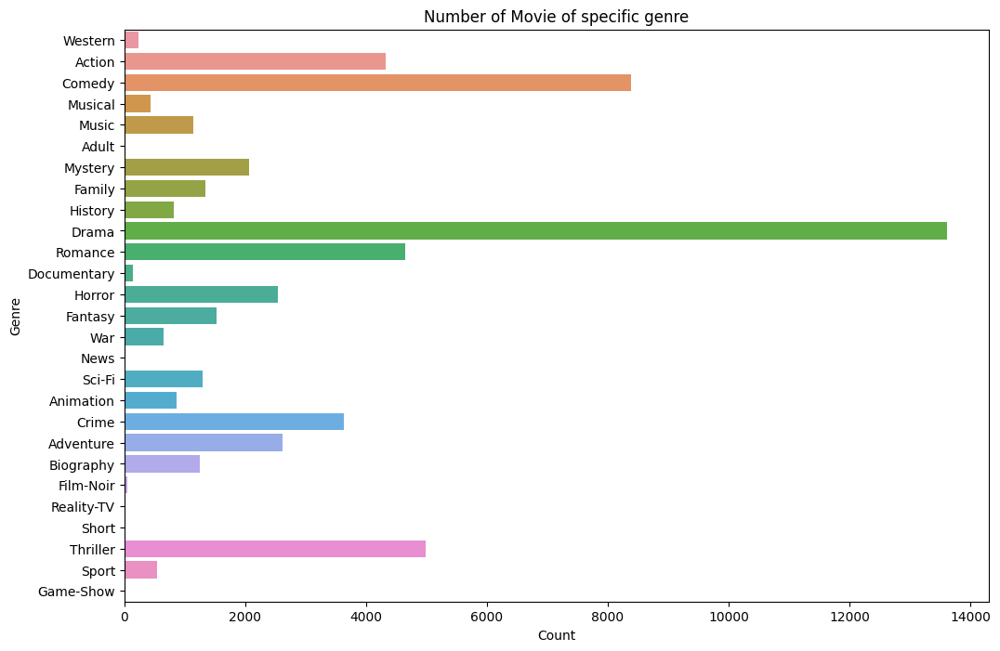

In [ ]:
plt.figure(figsize=(12,8))
sns.barplot(x= list(some_dictonary.values()), y=  list(some_dictonary.keys()))
plt.title("Number of Movie of specific genre")
plt.xlabel('Count')
plt.ylabel('Genre')
plt.show()

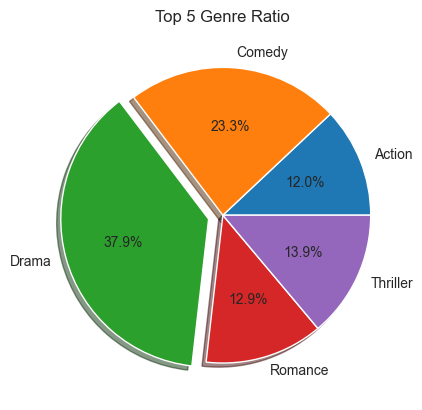

In [ ]:
# Lets better visualize the ratio for top 5 genre types

category = ['Drama', 'Action', 'Comedy', 'Thriller', 'Romance']
g5_dictonary = {}
for key, value in (enumerate(some_dictonary)):
    if value in category:
        g5_dictonary[value] = some_dictonary[value]
        
g5_group = pd.DataFrame.from_dict(g5_dictonary, orient='index', columns=['count'])
g5_group.head()

plt.title('Top 5 Genre Ratio')
sns.set_style("whitegrid")
# sns.color_palette("pastel")
plt.pie(x='count', data=g5_group, labels=g5_group.index, autopct='%1.1f%%', explode= [0,0,0.1,0,0], shadow= True)
plt.show()

In [ ]:
director_group = db.groupby('Director').agg({'Gross': 'sum', 'Director': 'count', 'Rating': 'mean'})
director_group.rename(columns= {'Director' : 'Count'}, inplace= True)
gross_ = director_group.sort_values('Gross', ascending=False).iloc[:10,:]
count_ = director_group.sort_values('Count', ascending=False).iloc[:10,:]
gross_.reset_index(inplace= True)
count_.reset_index(inplace= True)
gross_['Average_Gross'] = gross_['Gross']/gross_['Count']
count_['Average_Gross'] = count_['Gross']/count_['Count']

In [ ]:
gross_

,Director,Gross,Count,Rating,Average_Gross
0,Steven Spielberg,4700.40,34,7.323529,138.247059
1,James Cameron,2608.66,8,8.000000,326.082500
2,Michael Bay,2349.29,14,6.428571,167.806429
3,Anthony Russo,2281.45,7,7.142857,325.921429
4,Gonzalo Calzada,2256.14,1,5.000000,2256.140000
5,J.J. Abrams,2199.40,6,7.333333,366.566667
6,Peter Jackson,2134.38,11,7.818182,194.034545
7,Ron Howard,2111.60,25,6.760000,84.464000
8,Robert Zemeckis,2098.62,20,7.150000,104.931000
9,Christopher Nolan,2063.32,11,8.090909,187.574545


In [ ]:
count_

,Director,Gross,Count,Rating,Average_Gross
0,Woody Allen,575.87,44,6.954545,13.087955
1,Clint Eastwood,2010.91,38,6.921053,52.918684
2,Steven Spielberg,4700.40,34,7.323529,138.247059
3,Alfred Hitchcock,246.21,30,7.333333,8.207000
4,Steven Soderbergh,1145.81,29,6.551724,39.510690
5,Ridley Scott,1723.73,26,6.961538,66.297308
6,Robert Altman,577.43,25,6.560000,23.097200
7,Ron Howard,2111.60,25,6.760000,84.464000
8,Martin Scorsese,1031.22,24,7.583333,42.967500
9,Brian De Palma,662.49,23,6.478261,28.803913


In [ ]:
plt.figure(figsize=(10,6))
fig = px.bar(data_frame= gross_, y= 'Director', x='Gross', hover_data=['Count', 'Average_Gross'], color= 'Director')

fig.show()

<Figure size 1000x600 with 0 Axes>

In [ ]:
plt.figure(figsize=(10,6))
fig = px.bar(data_frame= count_, y='Director', x='Count', hover_data=['Gross', 'Average_Gross'], color= 'Director')
fig.show()

<Figure size 1000x600 with 0 Axes>

In [4]:
different_genre = db['Stars'].unique()
different_genre_set = []
for i in different_genre:
    temp = i.split(', ')
    different_genre_set.extend(temp)
different_genre_set = set(different_genre_set)
print(different_genre_set)
print(len(different_genre_set))
some_dictonary = {k:[0, 0, 0, 0, [] ] for k in different_genre_set}

{'Sean Bury', 'Joy Kim', 'Young-hoon Park', 'David Oakes', 'Bronagh Gallagher', 'Jeffery Roberson', 'Kotan Jacob', 'Patrick Zeller', 'Michelle Reese', 'Lee Sang-hee', 'Jessy Abdo', 'Jun Hu', 'Minami', 'Jennifer Aniston', 'Kerry Fox', 'Susie Porter', 'André Ramiro', 'Alma Beltran', 'Nicky Katt', 'Krister Henriksson', 'Michelle Gilliam', 'Usher', 'Martín Farina', 'Jack Matthews', 'Silvia Pérez', 'William Hurt', 'Adrian Holmes', 'Paula Kelly', 'Viktoria Brams', 'Gary Weeks', 'Barkhad Abdirahman', 'Kyndall', 'Benson Jack Anthony', 'Marcello Fonte', 'Jenn Harris', 'Elaine Kennedy', 'Gilles Renaud', 'Kelvin Boateng', 'Müge Boz', 'Manolo Fábregas', 'Jenna Augen', 'Ryôga Hayashi', 'Milan Hurduc', 'Dilara Aliyeva', 'Shahbaz Shigri', 'Anastasiya Lapina', 'Sidsel Siem Koch', 'Ann Robinson', 'Dónall Ó Héalai', 'Elif Kartal', 'Carlos Hernández', 'Glenn Kezer', 'Erik Thomson', 'Ellen Matt', 'Luiza Valdetaro', 'Kanako Higashi', 'Britta Andersson', 'Shruti Marathe', 'Michael Gwisdek', 'Gisele Bündchen

In [5]:
for index, j in db.iterrows():
    names = j['Stars'].split(', ')
    for name in names:
        some_dictonary[name][0] += 1
        some_dictonary[name][1] += j['Gross']
        some_dictonary[name][2] += j['Votes']
        some_dictonary[name][3] += j['Rating']
        some_dictonary[name][4].append(j['Genre'])

In [6]:
for index, value in enumerate(some_dictonary.values()):
    value[4] = max(set(value[4]), key= value[4].count).split(',')[0]                              # To get the most frequent Genre the specific actor work on (only getting 1 value)
   

In [7]:
some_dictonary

{'Sean Bury': [1, 14.0, 1062, 6, 'Comedy'],
 'Joy Kim': [1, 3.75, 3338, 6, 'Biography'],
 'Young-hoon Park': [1, 0.08, 295, 7, 'Action'],
 'David Oakes': [1, 0.74, 16825, 6, 'Action'],
 'Bronagh Gallagher': [2, 0.3, 1640, 12, 'Horror'],
 'Jeffery Roberson': [1, 0.15, 1536, 7, 'Comedy'],
 'Kotan Jacob': [1, 0.0, 2577, 6, 'Comedy'],
 'Patrick Zeller': [1, 0.86, 184, 5, 'Comedy'],
 'Michelle Reese': [1, 45.83, 274, 5, 'Comedy'],
 'Lee Sang-hee': [1, 4.69, 207, 6, 'Comedy'],
 'Jessy Abdo': [2, 3.84, 135, 10, 'Comedy'],
 'Jun Hu': [2, 0.12, 3208, 13, 'Biography'],
 'Minami': [1, 2.23, 809, 5, 'Action'],
 'Jennifer Aniston': [32, 1529.03, 3413138, 200, 'Comedy'],
 'Kerry Fox': [11, 35.91, 136128, 67, 'Drama'],
 'Susie Porter': [4, 0.37, 16782, 24, 'Comedy'],
 'André Ramiro': [1, 0.01, 106138, 8, 'Action'],
 'Alma Beltran': [1, 12.92, 5565, 5, 'Drama'],
 'Nicky Katt': [3, 56.24, 127624, 19, 'Comedy'],
 'Krister Henriksson': [3, 1.01, 13050, 19, 'Drama'],
 'Michelle Gilliam': [1, 0.02, 47, 6, 

In [8]:
star_df = pd.DataFrame.from_dict(some_dictonary, orient='index', columns=['Count', 'T_Gross', 'T_Votes', 'T_Rating', 'Favourite_Genre'])
star_df['Average_Gross'] = star_df['T_Gross']/ star_df['Count']
star_df['Average_Votes'] = star_df['T_Votes']/ star_df['Count']
star_df['Average_Rating'] = star_df['T_Rating']/ star_df['Count']
star_df.reset_index(inplace= True, names= 'Star')

In [9]:
star_df['Favourite_Genre'].nunique()

23

In [10]:
star_df

,Star,Count,T_Gross,T_Votes,T_Rating,Favourite_Genre,Average_Gross,Average_Votes,Average_Rating
0,Sean Bury,1,14.00,1062,6,Comedy,14.000000,1062.000000,6.0
1,Joy Kim,1,3.75,3338,6,Biography,3.750000,3338.000000,6.0
2,Young-hoon Park,1,0.08,295,7,Action,0.080000,295.000000,7.0
3,David Oakes,1,0.74,16825,6,Action,0.740000,16825.000000,6.0
4,Bronagh Gallagher,2,0.30,1640,12,Horror,0.150000,820.000000,6.0
...,...,...,...,...,...,...,...,...,...
43280,Ron Yuan,1,0.02,2128,5,Action,0.020000,2128.000000,5.0
43281,Nell Tiger Free,1,0.04,5437,5,Drama,0.040000,5437.000000,5.0
43282,Peter Sohn,1,118.31,111143,6,Animation,118.310000,111143.000000,6.0
43283,Raquel Garza,1,0.00,103,6,Animation,0.000000,103.000000,6.0


In [14]:
fig = px.scatter(star_df, x="Average_Rating", y="Count", hover_data=["Star", 'T_Gross', 'Average_Gross'], size = 'Average_Rating', color="Favourite_Genre", title="Relationship Cast with their favourite genre")
fig.show()

# ML Algo

C:\Users\keera\AppData\Local\Temp\ipykernel_1224\723317357.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(db.corr() ,annot=True)


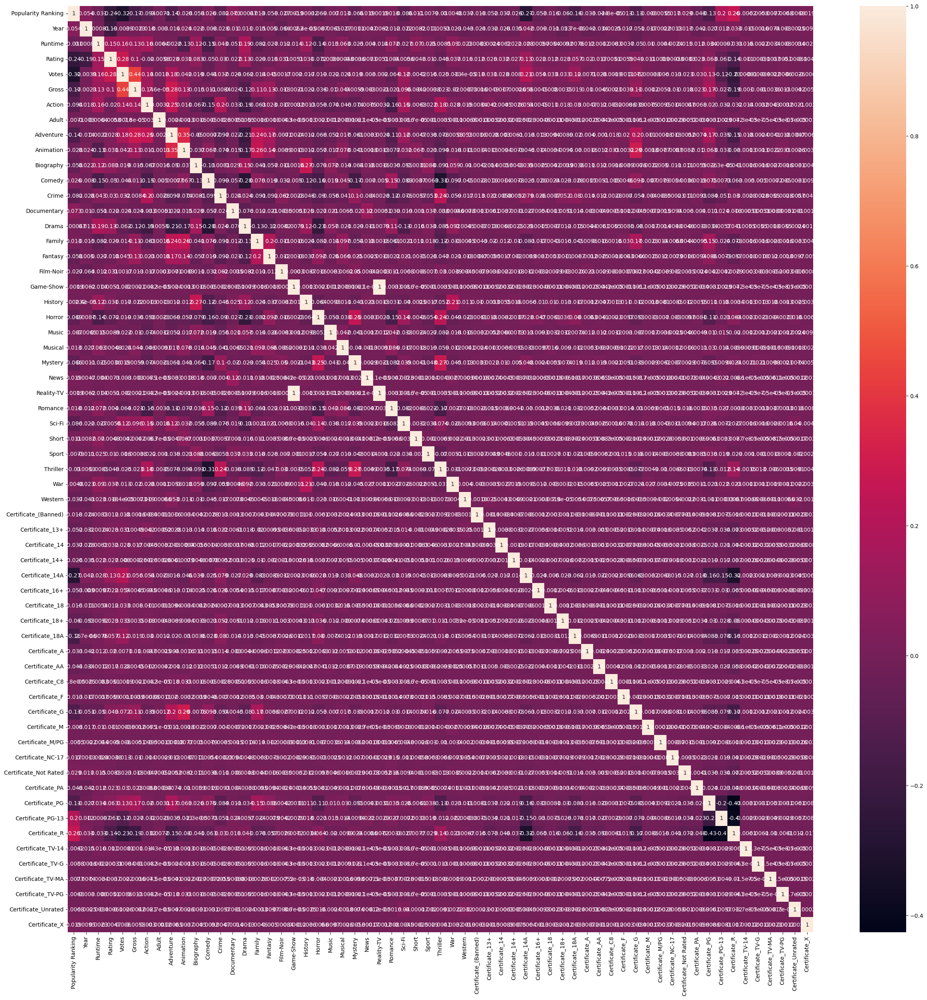

In [137]:
plt.figure(figsize=(30,30))
sns.heatmap(db.corr() ,annot=True)
plt.show()

### Regression

In [104]:
X = db.select_dtypes(exclude= ['object'])

y = X['Gross']
X = X.loc[ :, X.columns != 'Gross']

# K-Fold
kf = KFold(n_splits=10, shuffle=True, random_state=10)

# Regression modesl
models = {}
models['Linear Regression'] = LinearRegression()
models['Random Forest'] = RandomForestRegressor()
models['Lasso'] = Lasso(alpha = 0.3)
models['Ridge'] = Ridge(alpha = 0.3)    

y_pred = {}
mse, rmse, mae, score = defaultdict(list), defaultdict(list), defaultdict(list), defaultdict(list)
for key in models.keys():

    # Do K-fold here
    for train_index, test_index in kf.split(X, y):

        # Splitting
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        Y_train, Y_test = y.iloc[train_index], y.iloc[test_index]

        # Normalizing
        scaler = MinMaxScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        # Training
        models[key].fit(X_train, Y_train)
        y_pred[key] = models[key].predict(X_test)

        # Predicting
        mse[key].append(np.square(np.subtract(Y_test, y_pred[key])).mean())
        rmse[key].append(math.sqrt(mse[key][-1])) 
        mae[key].append(mean_absolute_error(Y_test, y_pred[key]))
        score[key].append(r2_score(Y_test, y_pred[key]))

In [106]:
for key in models:
    mse[key] = np.mean(mse[key])
    rmse[key] = np.mean(rmse[key])
    mae[key] = np.mean(mae[key])
    score[key] = np.mean(score[key])

In [98]:
result_df = pd.DataFrame(index=models.keys(), columns=["MSE", 'RMSE', 'MAE', 'R2_Score'])
result_df["MSE"] = mse.values()
result_df["RMSE"] = rmse.values()
result_df['MAE'] = mae.values()
result_df['R2_Score'] = score.values()
result_df.reset_index(inplace= True)
result_df

,index,MSE,RMSE,MAE,R2_Score
0,Linear Regression,4.290873e+25,2.522424e+12,7.231223e+10,-9.763590e+21
1,Random Forest,2.220678e+03,4.640005e+01,1.637142e+01,4.193458e-01
2,Lasso,2.869578e+03,5.315091e+01,2.015497e+01,2.473834e-01
3,Ridge,2.782142e+03,5.233378e+01,2.035822e+01,2.701258e-01


#### Doing wih polynomial feature

In [99]:
X = db.select_dtypes(exclude= ['object'])

y = X['Gross']
X = X.loc[ :, X.columns != 'Gross']

# K-Fold
kf = KFold(n_splits=10, shuffle=True, random_state=10)

# Regression modesl
models = {}
models['Linear Regression'] = LinearRegression()
models['Random Forest'] = RandomForestRegressor()
models['Lasso'] = Lasso(alpha = 0.3)
models['Ridge'] = Ridge(alpha = 0.3)

y_pred = {}
mse, rmse, mae, score = defaultdict(list), defaultdict(list), defaultdict(list), defaultdict(list)
for key in models.keys():

    # Do stratified K-fold here
    for train_index, test_index in kf.split(X, y):

        # Splitting
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        Y_train, Y_test = y.iloc[train_index], y.iloc[test_index]

        # Normalizing
        scaler = MinMaxScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        
        # Polynomial featuring
        poly = PolynomialFeatures(degree=2, include_bias=False)
        X_train = poly.fit_transform(X_train)
        X_test = poly.transform(X_test)

        # Training
        models[key].fit(X_train, Y_train)
        y_pred[key] = models[key].predict(X_test)

        # Predicting
        mse[key].append(np.square(np.subtract(Y_test, y_pred[key])).mean())
        rmse[key].append(math.sqrt(mse[key][-1])) 
        mae[key].append(mean_absolute_error(Y_test, y_pred[key]))
        score[key].append(r2_score(Y_test, y_pred[key]))

In [100]:
for key in models:
    mse[key] = np.mean(mse[key])
    rmse[key] = np.mean(rmse[key])
    mae[key] = np.mean(mae[key])
    score[key] = np.mean(score[key])

In [101]:
result_df = pd.DataFrame(index=models.keys(), columns=["MSE", 'RMSE', 'MAE', 'R2_Score'])
result_df["MSE"] = mse.values()
result_df["RMSE"] = rmse.values()
result_df['MAE'] = mae.values()
result_df['R2_Score'] = score.values()
result_df.reset_index(inplace= True)
result_df

,index,MSE,RMSE,MAE,R2_Score
0,Linear Regression,3.709311e+26,9.700289e+12,3.065336e+11,-8.493000e+22
1,Random Forest,2.074107e+03,4.488615e+01,1.599063e+01,4.526612e-01
2,Lasso,2.754521e+03,5.206346e+01,1.973331e+01,2.777265e-01
3,Ridge,2.339269e+03,4.790824e+01,1.978305e+01,3.868999e-01


### Classification

In [135]:
X = db.select_dtypes(exclude= ['object'])

y = X['Rating']
X = X.loc[ :, X.columns != 'Rating']

# Stratified K-Fold
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=10)

# Classification modesl
models = {}
models['Naive Bayes'] = GaussianNB()
models['Decision Tree'] = DecisionTreeClassifier()
models['Random Forest'] = RandomForestClassifier()
models['KNeighbours'] = KNeighborsClassifier()

cm = defaultdict(list)
for key in models.keys():

    # Do stratified K-fold here
    for train_index, test_index in skf.split(X, y):

        # Splitting
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        Y_train, Y_test = y.iloc[train_index], y.iloc[test_index]

        # Normalizing
        scaler = MinMaxScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        # Training
        models[key].fit(X_train, Y_train)
        y_pred = models[key].predict(X_test)

        # Confustion matrix
        cm[key].append(confusion_matrix(Y_test, y_pred))

In [136]:
merged_matrix = {}
for key in models:
    temp = np.zeros((10, 10))
    for matrix in cm[key]:
        temp += matrix
    merged_matrix[key] = (temp//10).astype(int)

C:\Users\keera\AppData\Local\Temp\ipykernel_33904\4114547097.py:24: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



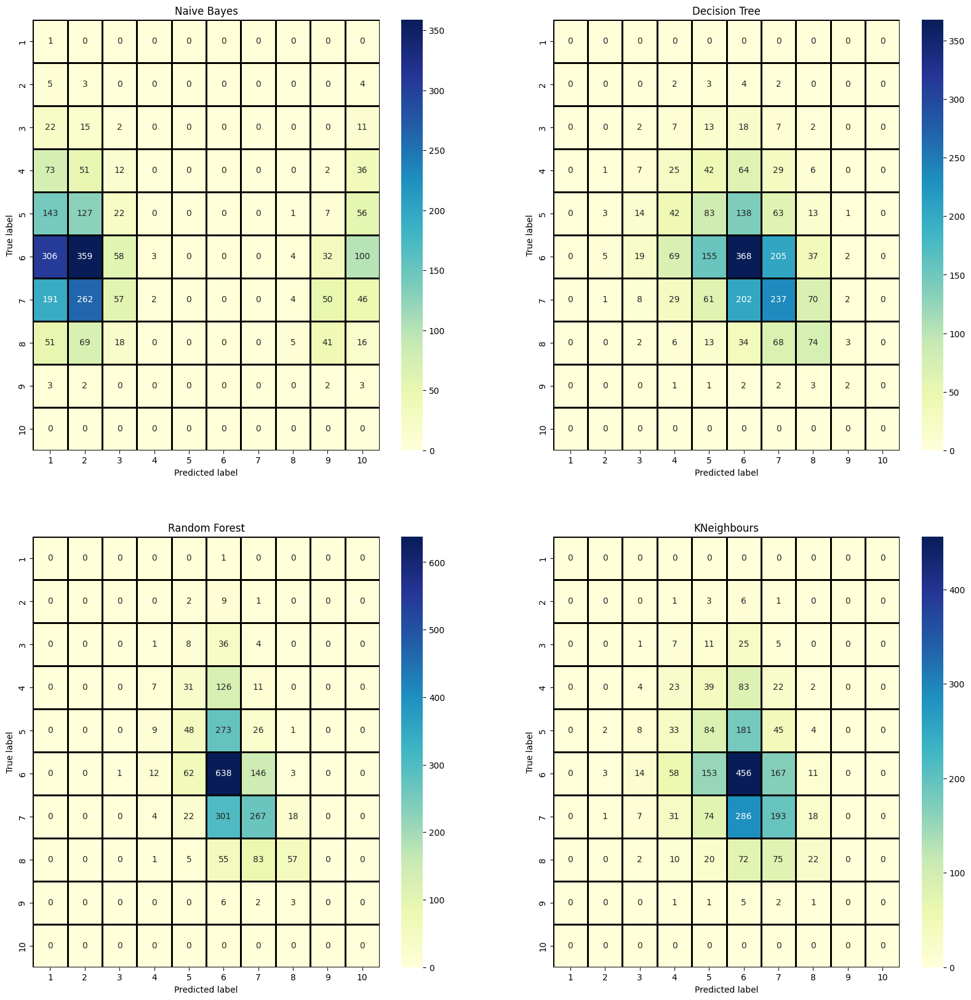

In [137]:
fig, axis = plt.subplots(2,2, figsize= (20,20))

sns.heatmap(merged_matrix['Naive Bayes'], annot=True, cmap="YlGnBu", fmt="d", xticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], yticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], ax= axis[0,0], linecolor='black', linewidths= 1)
sns.heatmap(merged_matrix['Decision Tree'], annot=True, cmap="YlGnBu", fmt="d", xticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], yticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], ax= axis[0,1], linecolor='black', linewidths= 1)
sns.heatmap(merged_matrix['Random Forest'], annot=True, cmap="YlGnBu", fmt="d", xticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], yticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], ax= axis[1,0], linecolor='black', linewidths= 1)
sns.heatmap(merged_matrix['KNeighbours'], annot=True, cmap="YlGnBu", fmt="d", xticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], yticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], ax= axis[1,1], linecolor='black', linewidths= 1)

axis[0,0].set_title('Naive Bayes')
axis[0,0].set_xlabel('Predicted label')
axis[0,0].set_ylabel('True label')

axis[0,1].set_title('Decision Tree')
axis[0,1].set_xlabel('Predicted label')
axis[0,1].set_ylabel('True label')

axis[1,0].set_title('Random Forest')
axis[1,0].set_xlabel('Predicted label')
axis[1,0].set_ylabel('True label')

axis[1,1].set_title('KNeighbours')
axis[1,1].set_xlabel('Predicted label')
axis[1,1].set_ylabel('True label')

fig.show()

In [138]:
accuracy, precision = {}, {}

for key in models.keys():

    # calculate accuracy
    accuracy[key] = np.sum(np.diag(merged_matrix[key])) / np.sum(merged_matrix[key])

    # calculate precision
    precision[key] = np.zeros(10)
    for i in range(10):
        precision[key][i] = merged_matrix[key][i, i] / np.sum(merged_matrix[key][:, i])

print("Accuracy:", accuracy)
print("Precision:", precision)

Accuracy: {'Naive Bayes': 0.005709266578831796, 'Decision Tree': 0.34815140845070425, 'Random Forest': 0.44605263157894737, 'KNeighbours': 0.3427188737351518}
Precision: {'Naive Bayes': array([0.00125786, 0.00337838, 0.01183432, 0.        ,        nan,
              nan,        nan, 0.35714286, 0.01492537, 0.        ]), 'Decision Tree': array([       nan, 0.        , 0.03846154, 0.13812155, 0.22371968,
       0.44337349, 0.38662316, 0.36097561, 0.2       ,        nan]), 'Random Forest': array([       nan,        nan, 0.        , 0.20588235, 0.26966292,
       0.44152249, 0.49444444, 0.69512195,        nan,        nan]), 'KNeighbours': array([       nan, 0.        , 0.02777778, 0.1402439 , 0.21818182,
       0.40933573, 0.37843137, 0.37931034,        nan,        nan])}


C:\Users\keera\AppData\Local\Temp\ipykernel_33904\948207414.py:11: RuntimeWarning:

invalid value encountered in long_scalars



#### LDA

In [143]:
X = db.select_dtypes(exclude= ['object'])

y = X['Rating']
X = X.loc[ :, X.columns != 'Rating']

# Stratified K-Fold
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=10)

# Classification modesl
models = {}
models['Naive Bayes'] = GaussianNB()
models['Decision Tree'] = DecisionTreeClassifier()
models['Random Forest'] = RandomForestClassifier()
models['KNeighbours'] = KNeighborsClassifier()

cm = defaultdict(list)
for key in models.keys():

    # Do stratified K-fold here
    for train_index, test_index in skf.split(X, y):

        # Splitting
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        Y_train, Y_test = y.iloc[train_index], y.iloc[test_index]

        # Normalizing
        scaler = MinMaxScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        
        # LDA
        lda = LinearDiscriminantAnalysis()
        lda.fit(X_train, Y_train)
        # Transform the data into the LDA feature space
        X_train_lda = lda.transform(X_train)
        X_test_lda = lda.transform(X_test)

        # Training
        models[key].fit(X_train_lda, Y_train)
        y_pred = models[key].predict(X_test_lda)

        # Confustion matrix
        cm[key].append(confusion_matrix(Y_test, y_pred))

In [144]:
merged_matrix = {}
for key in models:
    temp = np.zeros((10, 10))
    for matrix in cm[key]:
        temp += matrix
    merged_matrix[key] = (temp//10).astype(int)

C:\Users\keera\AppData\Local\Temp\ipykernel_33904\4114547097.py:24: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



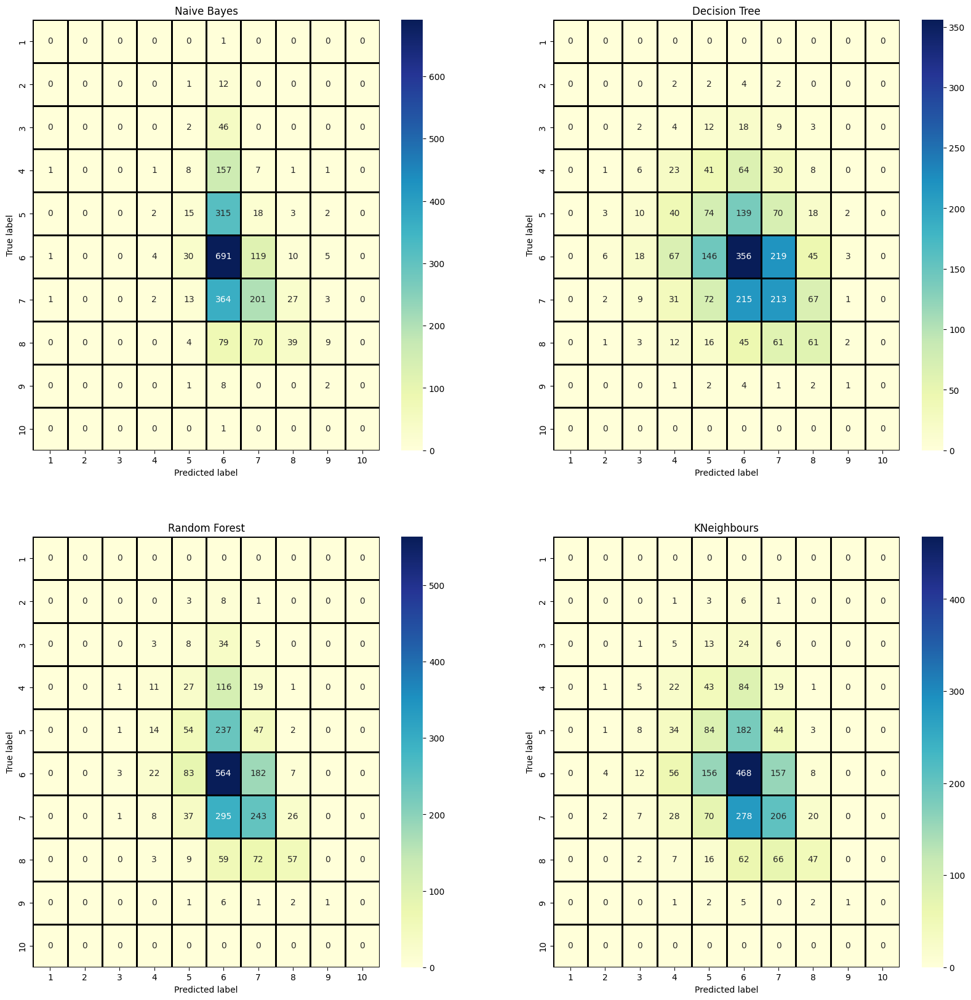

In [145]:
fig, axis = plt.subplots(2,2, figsize= (20,20))

sns.heatmap(merged_matrix['Naive Bayes'], annot=True, cmap="YlGnBu", fmt="d", xticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], yticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], ax= axis[0,0], linecolor='black', linewidths= 1)
sns.heatmap(merged_matrix['Decision Tree'], annot=True, cmap="YlGnBu", fmt="d", xticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], yticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], ax= axis[0,1], linecolor='black', linewidths= 1)
sns.heatmap(merged_matrix['Random Forest'], annot=True, cmap="YlGnBu", fmt="d", xticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], yticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], ax= axis[1,0], linecolor='black', linewidths= 1)
sns.heatmap(merged_matrix['KNeighbours'], annot=True, cmap="YlGnBu", fmt="d", xticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], yticklabels=['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], ax= axis[1,1], linecolor='black', linewidths= 1)

axis[0,0].set_title('Naive Bayes')
axis[0,0].set_xlabel('Predicted label')
axis[0,0].set_ylabel('True label')

axis[0,1].set_title('Decision Tree')
axis[0,1].set_xlabel('Predicted label')
axis[0,1].set_ylabel('True label')

axis[1,0].set_title('Random Forest')
axis[1,0].set_xlabel('Predicted label')
axis[1,0].set_ylabel('True label')

axis[1,1].set_title('KNeighbours')
axis[1,1].set_xlabel('Predicted label')
axis[1,1].set_ylabel('True label')

fig.show()

In [146]:
accuracy, precision = {}, {}

for key in models.keys():

    # calculate accuracy
    accuracy[key] = np.sum(np.diag(merged_matrix[key])) / np.sum(merged_matrix[key])

    # calculate precision
    precision[key] = np.zeros(10)
    for i in range(10):
        precision[key][i] = merged_matrix[key][i, i] / np.sum(merged_matrix[key][:, i])

print("Accuracy:", accuracy)
print("Precision:", precision)

Accuracy: {'Naive Bayes': 0.41677646025472115, 'Decision Tree': 0.32172763331864257, 'Random Forest': 0.40897097625329815, 'KNeighbours': 0.36455584872471414}
Precision: {'Naive Bayes': array([0.        ,        nan,        nan, 0.11111111, 0.2027027 ,
       0.41278375, 0.48433735, 0.4875    , 0.09090909,        nan]), 'Decision Tree': array([       nan, 0.        , 0.04166667, 0.12777778, 0.20273973,
       0.42130178, 0.35206612, 0.29901961, 0.11111111,        nan]), 'Random Forest': array([       nan,        nan, 0.        , 0.18032787, 0.24324324,
       0.42759666, 0.42631579, 0.6       , 1.        ,        nan]), 'KNeighbours': array([       nan, 0.        , 0.02857143, 0.14285714, 0.21705426,
       0.4220018 , 0.41282565, 0.58024691, 1.        ,        nan])}


C:\Users\keera\AppData\Local\Temp\ipykernel_33904\948207414.py:11: RuntimeWarning:

invalid value encountered in long_scalars



# NLP Techniques

In [3]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from string import punctuation

nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\keera\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\keera\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\keera\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     C:\Users\keera\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     C:\Users\keera\AppData\Roaming\nltk_data...
[nltk_data]    | 

True

In [8]:
X = db.copy()

In [9]:
X['tags'] = X['Summary'] + '' + '' + X['Stars'] + '' + X['Director']
X.drop(columns= ['Summary', 'Stars', 'Director'], inplace= True)

In [10]:
stop_word = stopwords.words('english')
lemmatizer = WordNetLemmatizer()
punctuation = list(punctuation)

In [11]:
def lemmatizing(sentence):
    filter_sentence = []
    words = nltk.word_tokenize(sentence)                                                                    # Tokenizing
    words = [w.lower() for w in words if (w not in stop_word) and (w not in punctuation)]                   # Removing stopwords and punctuation

    for word in words:
        filter_sentence.append(lemmatizer.lemmatize(word))
    
    # print(filter_sentence)
    return filter_sentence

X['tags'] = X['tags'].apply(lemmatizing) 

### TF-IDF

In [12]:
X['tags']

0        [a, middle-aged, chinese, immigrant, swept, in...
1        [an, ex-hit-man, come, retirement, track, gang...
2        [john, wick, run, killing, member, internation...
3        [otto, grump, 's, given, life, following, loss...
4        [when, pus, boot, discovers, passion, adventur...
                               ...                        
23036    [cesare, proietti, esteemed, manager, relais, ...
23037    [two, brother, get, caught, bitter, battle, ho...
23038    [the, murder, three, young, girl, committed, s...
23039    [a, young, boy, travel, alaska, visit, estrang...
23040    [the, member, extended, family, find, isolated...
Name: tags, Length: 23041, dtype: object

In [13]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(max_features= 10000)

summary = []
for index, row in X.iterrows():
    summary.append(' '.join(row['tags']))

feature_matrix = tfidf.fit_transform(summary)
feature_db = pd.DataFrame(feature_matrix.toarray(), index=X['tags'].index.tolist())

### Dimension Reduction

In [14]:
from sklearn.decomposition import TruncatedSVD

In [15]:
# Using Truncated SVD to reduce the dimensions of the data to 10000
number_of_dimensions = 10000
svd = TruncatedSVD(n_components= number_of_dimensions)
X_tsvd = svd.fit_transform(feature_db)
print(X_tsvd.shape)

# List of explained variances
tsvd_var_ratios = svd.explained_variance_ratio_

var_explained = svd.explained_variance_ratio_.sum()
print(var_explained)

(23041, 10000)
0.9999999999999889


In [16]:
X_tsvd

array([[ 7.29583893e-02, -2.48737975e-02,  1.80679009e-03, ...,
         9.09748669e-18, -1.51040657e-17, -3.71980618e-17],
       [ 9.58137982e-02, -5.59464221e-02, -1.20231206e-03, ...,
         4.35301725e-17, -1.92490995e-17,  4.35623315e-17],
       [ 6.97826464e-02, -4.13366219e-02, -1.02640939e-03, ...,
        -1.13027760e-17, -8.83827159e-19,  3.12626852e-17],
       ...,
       [ 1.13506955e-01, -4.63563382e-02, -3.02298339e-04, ...,
         1.56590006e-17, -3.06142829e-17,  9.66420206e-18],
       [ 1.22904757e-01, -5.05043335e-02, -7.57571902e-03, ...,
        -4.46479372e-18,  3.77046383e-17, -5.20949371e-17],
       [ 9.82361355e-02, -2.23608568e-02, -6.87721510e-04, ...,
        -2.12041569e-17,  3.99505935e-17,  3.69359493e-17]])

In [17]:
from sklearn.metrics.pairwise import cosine_similarity
cosine_similarity = cosine_similarity(X_tsvd)

In [18]:
def recommendation_cosine(movie_title):
    id_of_movie = db[db['Name']==movie_title].index[0]
    distances = cosine_similarity[id_of_movie]
    movie_list = sorted(list(enumerate(distances)), reverse=True, key=lambda x:x[1])[1:11]
    
    for i in movie_list:
        print(movie_list.index(i)+1,"", db.iloc[i[0]]['Name'])

In [19]:
recommendation_cosine('John Wick')

1  Feeling Minnesota
2  Kite
3  Man of Tai Chi
4  Henry's Crime
5  The Watcher
6  John Wick: Chapter 3 - Parabellum
7  Jigarthanda
8  Point Break
9  Street Kings
10  Plastic


In [20]:
from sklearn.manifold import TSNE

In [21]:
# Using TSNE to transform the data into 2 dimentions for plotting in 2 dimensions
tsne = TSNE(n_components= 2, init='random')
tsne_data = tsne.fit_transform(X_tsvd)
tsne_data = pd.DataFrame(tsne_data, columns=['x', 'y'])

In [22]:
tsne_data['Name'] = db['Name'].copy()

In [23]:
tsne_data.to_csv("Visualising.csv")

In [24]:
tsne_data

,x,y,Name
0,-58.353588,29.346304,Everything Everywhere All at Once
1,-67.970764,-6.586046,John Wick
2,-69.330696,-6.038342,John Wick: Chapter 3 - Parabellum
3,62.505863,-24.698687,A Man Called Otto
4,15.498473,-72.466400,Puss in Boots: The Last Wish
...,...,...,...
23036,72.128433,-18.264814,Amici come prima
23037,25.274014,-44.585426,Het verlangen
23038,27.820484,56.841888,Cocktail
23039,32.317585,-53.557655,Northern Lights: A Journey to Love


In [ ]:
# We are not visualizing this since, we don't have enough memory in our laptop

data = go.Scatter(x=tsne_data['x'],y=tsne_data['y'],text=tsne_data['Name'],mode='markers+text', fill= 'none')
fig = go.Figure(data=data)
fig.show()